<a href="https://colab.research.google.com/github/shreyesss/CRACK_DETECTION-CVI2021/blob/pix2pix/Pix2Pix_Crack.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setting Up

In [1]:
!pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 13.4 MB/s 


In [2]:
import tensorflow as tf
import tensorflow_addons as tfa

import os
import time

from matplotlib import pyplot as plt
from IPython import display

import numpy as np
import random

tf.random.set_seed(42)
random.seed(42)

In [3]:
!pip install -U tensorboard

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Loading the Dataset

In [5]:
BUFFER_SIZE = 400
BATCH_SIZE = 32
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [6]:
def load(image_file):
  image = tf.io.read_file(image_file)
  image = tf.image.decode_jpeg(image)

  w = tf.shape(image)[1]

  w = w // 2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  real_image = tf.image.rgb_to_grayscale(real_image)

  return input_image, real_image

In [7]:
def crop(input_image, real_image):
    scale = IMG_HEIGHT/448
    cropped_input = tf.image.central_crop(input_image, central_fraction = 256/448 )
    cropped_real = tf.image.central_crop(real_image, central_fraction = 256/448 )
    cropped_input = tf.image.resize(cropped_input, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    cropped_real = tf.image.resize(cropped_real, [256, 256],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return cropped_input, cropped_real

In [8]:
# normalizing the images to [-1, 1]

def normalize(input_image, real_image):
    input_image = (input_image / 127.5) - 1
    real_image = (real_image / 127.5) - 1

    input_image = tf.clip_by_value(input_image, -1, 1)
    real_image = tf.clip_by_value(real_image, -1, 1)

    return input_image, real_image

In [9]:
def flipleftright(input_image,real_image):
  if tf.random.uniform(()) > 0.5:
     #random mirroring
        input_image = tf.image.flip_left_right(input_image)
        real_image = tf.image.flip_left_right(real_image)
  return input_image, real_image

In [10]:
def flipupdown(input_image,real_image):
  if tf.random.uniform(()) > 0.5:
      input_image = tf.image.flip_up_down(input_image)
      real_image = tf.image.flip_up_down(real_image)
  return input_image, real_image

In [11]:
def randomrotate(input_image,real_image):
  p = tf.random.uniform(())
  if p <= 0.25:
    input_image = tfa.image.rotate(input_image, np.pi/2)
    real_image = tfa.image.rotate(real_image, np.pi/2)
  elif p<=0.5:
    input_image = tfa.image.rotate(input_image, np.pi)
    real_image = tfa.image.rotate(real_image, np.pi)
  elif p<=0.75:
    input_image = tfa.image.rotate(input_image, 1.5*np.pi)
    real_image = tfa.image.rotate(real_image, 1.5*np.pi)
  
  return input_image, real_image

In [12]:
def multiply(input_image,real_image):
  alpha = random.uniform(0.8, 1.5)
  input_image = alpha*input_image
  
  return input_image, real_image

In [13]:
def gaussianblur(input_image,real_image):
  sig = random.uniform(0, 5)
  input_image = tfa.image.gaussian_filter2d(input_image, filter_shape =  (3, 3), sigma = sig)

  return input_image, real_image

In [14]:
@tf.function()
def operations(input_image, real_image):

  # cropping to 256 x 256 x 3
    input_image, real_image = crop(input_image, real_image)

    funcs = [flipleftright,flipupdown,randomrotate,multiply,gaussianblur]
    random.shuffle(funcs)

    for function in funcs:
      input_image, real_image = function(input_image, real_image)

    return input_image, real_image

In [19]:
def load_image_train(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = operations(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [16]:
def load_image_test(image_file):
    input_image, real_image = load(image_file)
    input_image, real_image = crop(input_image, real_image)
    input_image, real_image = normalize(input_image, real_image)

    return input_image, real_image

In [20]:
train_dataset = tf.data.Dataset.list_files(r'/content/gdrive/MyDrive/CrackGAN/dj_train/*.jpg')

train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [21]:
test_dataset = tf.data.Dataset.list_files(r'/content/gdrive/MyDrive/CrackGAN/dj_test/*.jpg')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [22]:
train_dataset

<BatchDataset shapes: ((None, None, None, None), (None, 256, 256, 1)), types: (tf.float32, tf.float32)>

# Building the Generator

In [23]:
OUTPUT_CHANNELS = 1

In [24]:
def downsample(filters, size, apply_batchnorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_batchnorm:
        result.add(tf.keras.layers.BatchNormalization())

    result.add(tf.keras.layers.LeakyReLU())

    return result

In [25]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

    result.add(tf.keras.layers.BatchNormalization())

    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))

    result.add(tf.keras.layers.ReLU())

    return result

In [26]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
    ]

    up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

    x = inputs

  # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

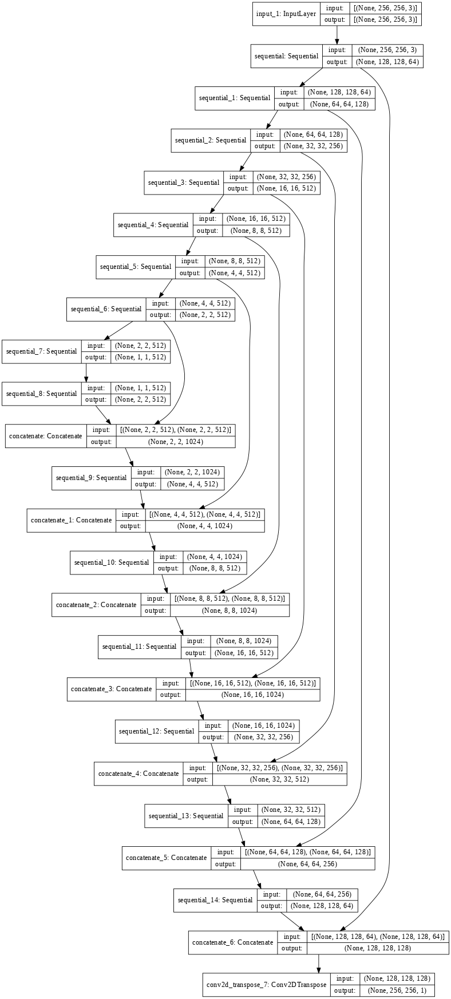

In [27]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [28]:
LAMBDA = 100

In [29]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [30]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

    total_gen_loss = gan_loss + (LAMBDA * l1_loss)

    return total_gen_loss, gan_loss, l1_loss

# Building the Discriminator

In [31]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)

    inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
    tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')

    x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

    down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
    conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

    batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

    leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

    last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=[inp, tar], outputs=last)

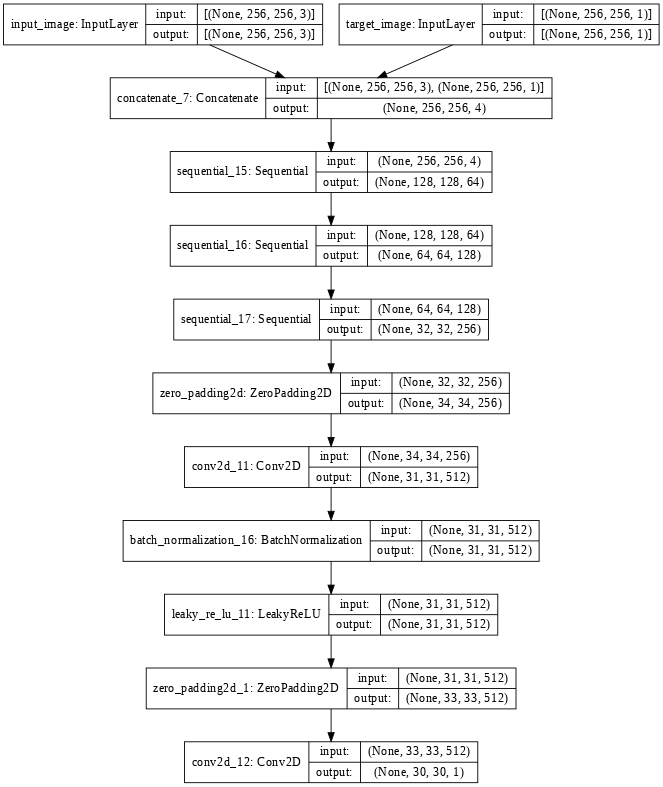

In [32]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [33]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

    generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss

# Checkpoints and Optimizers

In [34]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [35]:
checkpoint_dir = './gdrive/MyDrive/CrackGAN/Checkpoints-Model-2'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

# Generating Images

In [36]:
def generate_images(model, test_input, tar):
    prediction = model(test_input, training=True)
    plt.figure(figsize=(15, 15))
    plot_tar = np.reshape(tar[0],(256,256))
    #print(plot_tar)
    plot_pred = np.reshape(prediction[0],(256,256)).copy()
    
    display_list = [test_input[0], plot_tar, plot_pred]
    title = ['Input Image', 'Ground Truth', 'Predicted Image']

    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
        plt.imshow(display_list[i] * 0.5 + 0.5,cmap='gray')
        plt.axis('off')
    plt.show()

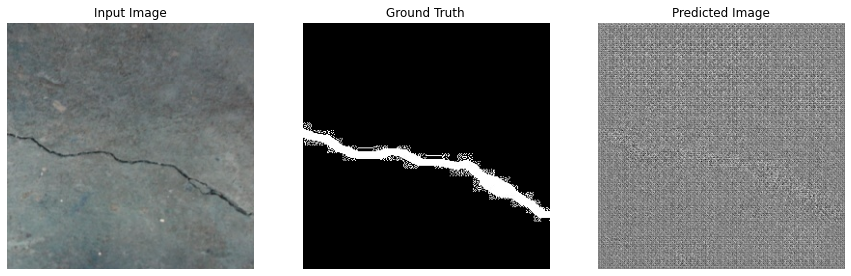

In [38]:
for example_input, example_target in test_dataset.take(1):
    generate_images(generator, example_input, example_target)

# Training

In [39]:
EPOCHS = 9

In [40]:
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [41]:
@tf.function
def train_step(input_image, target, epoch):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = generator(input_image, training=True)

        disc_real_output = discriminator([input_image, target], training=True)
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

    with summary_writer.as_default():
        tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
        tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
        tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
        tf.summary.scalar('disc_loss', disc_loss, step=epoch)

In [42]:
def fit(train_ds, epochs, test_ds):
  for epoch in range(epochs):
    start = time.time()

    display.clear_output(wait=True)

    for example_input, example_target in test_ds.take(1):
      generate_images(generator, example_input, example_target)
    print("Epoch: ", epoch)

    # Train
    for n, (input_image, target) in train_ds.enumerate():
      print('.', end='')
      if (n+1) % 100 == 0:
        print()
      train_step(input_image, target, epoch)
    print()

    # saving (checkpoint) the model every 20 epochs
    #if (epoch + 1) % 20 == 0:
    checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

# Restoring Checkpoints and Actual Training

In [43]:
#docs_infra: no_execute
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

In [44]:
latest = tf.train.latest_checkpoint(checkpoint_dir)
print(latest)

./gdrive/MyDrive/CrackGAN/Checkpoints-Model-2/ckpt-31


In [45]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
fit(train_dataset, EPOCHS, test_dataset)

# Generating for Train and Test Data

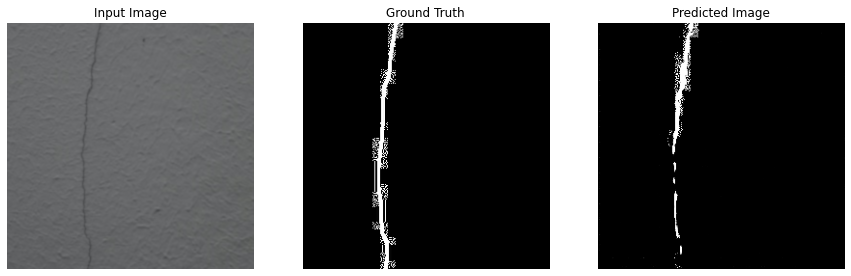

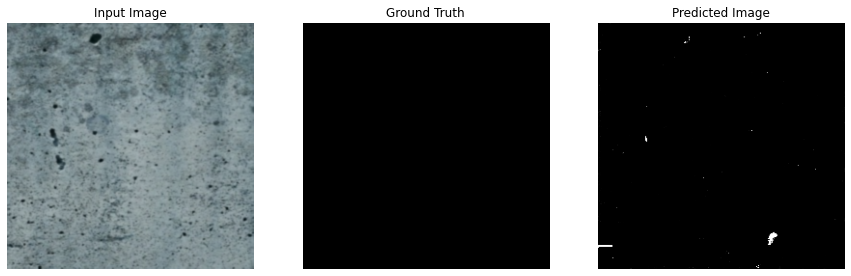

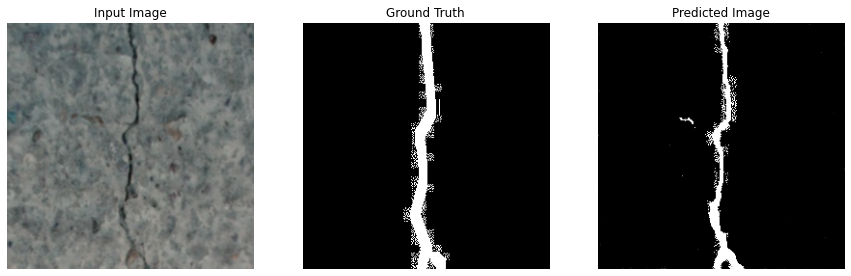

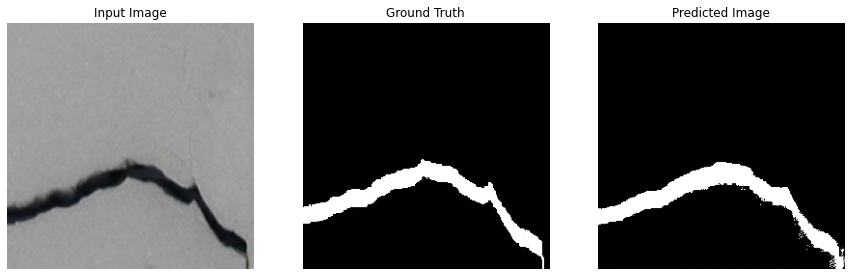

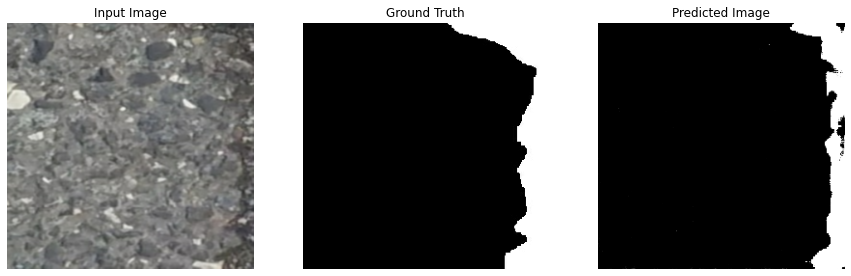

In [46]:
for example_input, example_target in train_dataset.take(5):
    generate_images(generator, example_input, example_target)

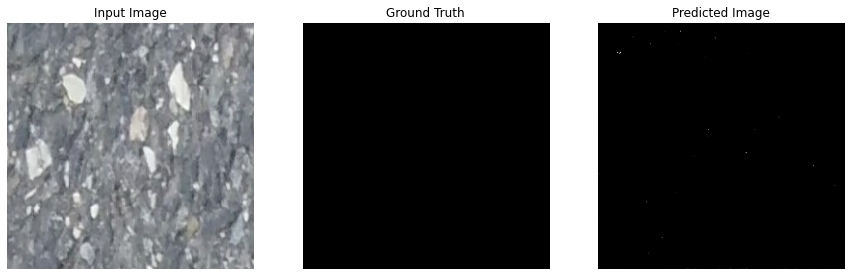

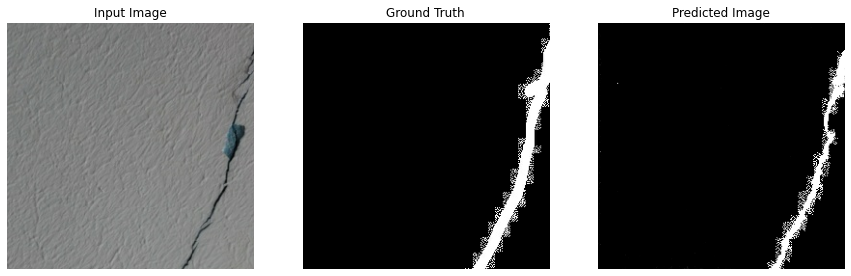

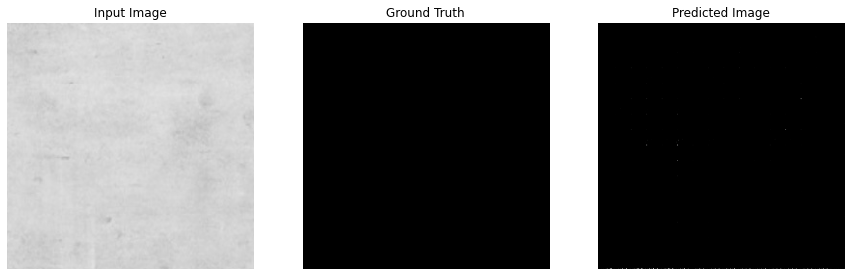

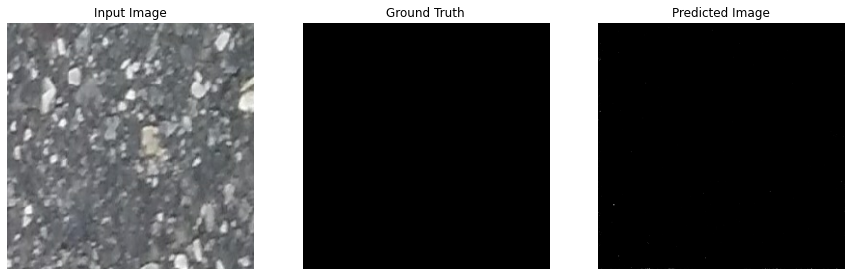

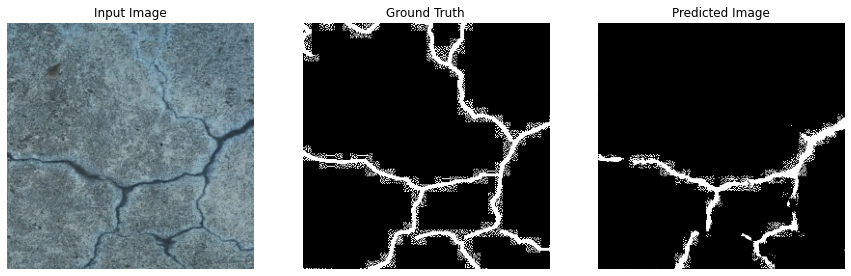

In [47]:
for example_input, example_target in test_dataset.take(5):
    generate_images(generator, example_input, example_target)

# Metric Evaluation

In [48]:
from sklearn.metrics import jaccard_score
import cv2

In [49]:
thresholds = np.linspace(0, 1, 10, endpoint=False)
thresholds = np.ndarray.tolist(thresholds)
thresholds = [round(num, 1) for num in thresholds]

In [50]:
def ods(target,predict):
  f1_list = []
  f1 = 0
  for l in thresholds:    
          actual = target.copy() 
          predicted = predict.copy()

          actual[actual>l] = 1
          actual[actual<=l] = 0

          predicted[predicted>l] = 1
          predicted[predicted<=l] = 0

          p = tf.keras.metrics.MeanIoU(num_classes=2)
          p.update_state(actual.flatten(), predicted.flatten())
          f1_list.append(p.result().numpy())
          p.reset_state()
  ODS = max(f1_list)
  return ODS

In [51]:
a = list(test_dataset.as_numpy_iterator())

In [52]:
count = 0
ious = []
odsscores = []
checker = []
jaccard = []


for inp, tar in a:
  prediction = generator(inp, training=True)
  n = len(tar)


  for p in range(0,n):
    jaccard_flag = 0

    plot_tar = np.reshape(tar[p],(256,256)).copy()
    plot_pred = np.reshape(prediction[p],(256,256)).copy()

    plot_tar = 0.5*plot_tar + 0.5
    plot_pred = 0.5*plot_pred + 0.5
    
    ods_score = ods(plot_tar,plot_pred)
    odsscores.append(ods_score)

    for i in range(0,256):
      for j in range(0,256):
        if plot_pred[i][j]>=0.5:
          plot_pred[i][j] = 1
        else:
          plot_pred[i][j] = 0

    for i in range(0,256):
      for j in range(0,256):
        if plot_tar[i][j]>=0.5:
          plot_tar[i][j] = 1
        else:
          plot_tar[i][j] = 0
    
    plot_pred2 = plot_pred.flatten()
    plot_tar2 = plot_tar.flatten()

    if (plot_tar2==1).sum() != 0 and (plot_pred2==1).sum() != 0:
      jaccard.append(jaccard_score(plot_tar2,plot_pred2))
      jaccard_flag = 1

    m = tf.keras.metrics.MeanIoU(num_classes=2)
    m.update_state(plot_tar2, plot_pred2)
    ious.append(m.result().numpy())
    
    if count%80 == 0:
      if jaccard_flag == 1:
        checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),jaccard_score(plot_tar2,plot_pred2)])
      else:
        checker.append([inp,plot_tar,plot_pred,ods_score,m.result().numpy(),-1])
    count = count+1

    m.reset_state()

In [53]:
np.mean(jaccard)

0.398724770777135

In [54]:
np.mean(odsscores)

0.7023086

In [55]:
np.mean(ious)

0.6665772

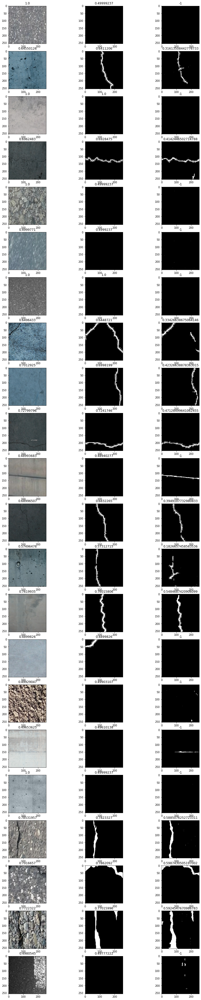

In [56]:
f,axs = plt.subplots(nrows=len(checker),ncols=3,figsize=(15,70))
count = 0
for i in range(0,len(checker)):
  p = checker[i]
  input = p[0]
  input = 0.5*input + 0.5
  target = p[1]
  prediction = p[2]
  odstemp = p[3]
  miou = p[4]
  jac = p[5]
  axs[i][0].imshow(input[count%32],cmap='gray')
  axs[i][1].imshow(target,cmap='gray')
  axs[i][2].imshow(prediction,cmap='gray')
  axs[i][0].set_title(odstemp)
  axs[i][1].set_title(miou)
  axs[i][2].set_title(jac)
  count = count+80